In [1]:
!pip install scanpy -q
!pip install scikit-optimize -q
!pip install keras-tuner -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 54.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.3 MB/s eta 0:00:00


In [2]:
import numpy as np
import scanpy as sp
import pandas as pd
import pickle
import shutil
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, ConfusionMatrixDisplay


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.metrics import SparseCategoricalAccuracy
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import keras_tuner as kt
from keras_tuner import Hyperband

seed = 2023 # DO NOT CHANGE!

In [3]:
print(f"sklearn version: {sk.__version__}")
print(f"numpy version: {np.__version__}")
print(f"pandas version: {pd.__version__}")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"scanpy version: {sp.__version__}")
print(f"tensorflow version: {tf.__version__}")
print(f"keras tuner version: {kt.__version__}")

sklearn version: 1.2.2
numpy version: 1.25.2
pandas version: 2.0.3
matplotlib version: 3.7.1
scanpy version: 1.10.1
tensorflow version: 2.15.0
keras tuner version: 1.4.7


# Data lodaing

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
BMMC = sp.read_h5ad("/content/drive/MyDrive/Design/GSE194122_openproblems_neurips2021_multiome_BMMC_processed.h5ad")

In [6]:
print(f"The data has {BMMC.n_obs} observations and {BMMC.n_vars} features.")

The data has 69249 observations and 129921 features.


In [7]:
BMMC

AnnData object with n_obs × n_vars = 69249 × 129921
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap'
    layers: 'counts'

# Train/ Validation / Test split

We seperate a few donors for test set (best practise).
<br>Single donor was selected for validation.



In [8]:
BMMC.obs.drop_duplicates(subset=["DonorID"], keep='first').reset_index()[["Site","DonorID","DonorAge","DonorBMI","DonorBloodType","DonorRace","Ethnicity","DonorGender","QCMeds","DonorSmoker"]].set_index('DonorID').sort_values(by=['DonorID'])

,Site,DonorAge,DonorBMI,DonorBloodType,DonorRace,Ethnicity,DonorGender,QCMeds,DonorSmoker
DonorID,,,,,,,,,
10886,site1,35,28.6,B+,Asian,NOT HISPANIC OR LATINO,Female,True,Nonsmoker
11466,site3,22,31.5,A+,Asian,NOT HISPANIC OR LATINO,Female,True,Nonsmoker
12710,site2,27,32.1,O+,White,NOT HISPANIC OR LATINO,Male,False,Nonsmoker
13272,site4,35,31.0,O+,Other Race,HISPANIC OR LATINO,Male,False,Nonsmoker
15078,site1,34,24.8,B-,White,HISPANIC OR LATINO,Male,False,Nonsmoker
16710,site2,40,27.8,O+,White,HISPANIC OR LATINO,Female,False,Smoker
18303,site1,33,24.0,O+,Asian,NOT HISPANIC OR LATINO,Male,False,Smoker
19593,site4,31,32.6,A+,Black or African American,NOT HISPANIC OR LATINO,Male,False,Nonsmoker
28045,site3,36,23.8,A+,Other Race,HISPANIC OR LATINO,Female,False,Nonsmoker


69249 samples of 10 donors


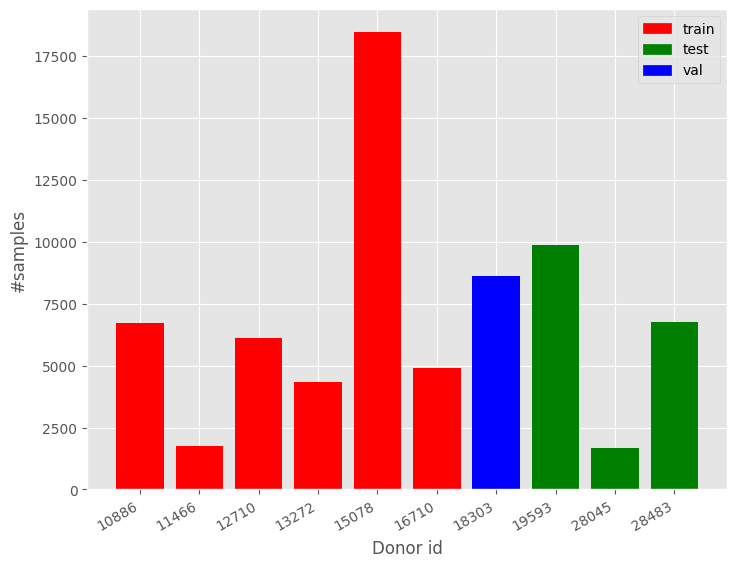

In [9]:
donors, donor_sample_count = np.unique(BMMC.obs['DonorID'], return_counts=True)
color = ['red', 'red', 'red', 'red', 'red', 'red', 'b', 'green', 'green', 'green']
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
print(f"{np.sum(donor_sample_count)} samples of {len(donors)} donors")
ax.bar(list(map(str, donors)), donor_sample_count, color=color)
plt.xticks(rotation=30, ha='right')
plt.xlabel("Donor id")
plt.ylabel("#samples")
colors = {'train':'red', 'test':'green', 'val':'b'}
labels = list(colors.keys())

handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels)
plt.show()

In [10]:
test_donors_idx = [19593, 28045, 28483]
test_filter = np.isin(BMMC.obs['DonorID'], test_donors_idx)

val_filter_idx = [18303]
val_filter = np.isin(BMMC.obs['DonorID'], val_filter_idx)

train_filter_idx = [10886,16710,11466,13272,15078,12710]
train_filter = np.isin(BMMC.obs['DonorID'], train_filter_idx)

n_train = np.sum(train_filter)
n_val = np.sum(val_filter)
n_test = np.sum(test_filter)


print(f"{n_train} train samples")
print(f"{n_val} validation samples")
print(f"{n_test} test samples")
print(f"{n_train/(n_train+n_val+n_test)*100:.2f}% of samples used for training")
print(f"{n_val/(n_train+n_val+n_test)*100:.2f}% of samples used for validation")
print(f"{n_test/(n_train+n_val+n_test)*100:.2f}% of samples used for testing")

42309 train samples
8604 validation samples
18336 test samples
61.10% of samples used for training
12.42% of samples used for validation
26.48% of samples used for testing


In [11]:
X_test = BMMC.obsm['ATAC_gene_activity'][test_filter]
X_train = BMMC.obsm['ATAC_gene_activity'][train_filter]
X_val = BMMC.obsm['ATAC_gene_activity'][val_filter]

Y_test = BMMC.obs['cell_type'][test_filter]
Y_train = BMMC.obs['cell_type'][train_filter]
Y_val = BMMC.obs['cell_type'][val_filter]

In [12]:
train_donors = BMMC.obs[train_filter]['DonorID']
val_donors = BMMC.obs[train_filter]['DonorID']
test_donors = BMMC.obs[test_filter]['DonorID']
full_donors = BMMC.obs['DonorID']

## Label Encoding and conversion to dense tensors

In [13]:
label_encoder = LabelEncoder()
label_encoder.fit(BMMC.obs['cell_type'])
Y_train_encoded = label_encoder.transform(Y_train)
Y_test_encoded = label_encoder.transform(Y_test)
Y_val_encoded = label_encoder.transform(Y_val)
Y_full = label_encoder.transform(BMMC.obs['cell_type'])

num_classes = len(np.unique(Y_train_encoded))

def sparse_to_dense(sparse):
    return tf.convert_to_tensor(sparse.todense(), dtype=tf.float32)

X_train_dense = sparse_to_dense(X_train)
X_test_dense = sparse_to_dense(X_test)
X_val_dense = sparse_to_dense(X_val)
X_full_dense = sparse_to_dense(BMMC.obsm['ATAC_gene_activity'])

# Data visualistion

In [14]:
cell_types = np.unique(BMMC.obs['cell_type'])
print(cell_types)

['B1 B' 'CD14+ Mono' 'CD16+ Mono' 'CD4+ T activated' 'CD4+ T naive'
 'CD8+ T' 'CD8+ T naive' 'Erythroblast' 'G/M prog' 'HSC'
 'ID2-hi myeloid prog' 'ILC' 'Lymph prog' 'MK/E prog' 'NK' 'Naive CD20+ B'
 'Normoblast' 'Plasma cell' 'Proerythroblast' 'Transitional B' 'cDC2'
 'pDC']


In [15]:
main_cell_types = {
    'Monocytes': ['CD14+ Mono', 'CD16+ Mono'],
    'Plasmacytoid Dendritic Cells': ['pDC'],
    'Myeloid Dendritic Cells': ['cDC2'],
    'B Cells': ['Naive CD20+ B', 'Transitional B', 'B1 B', 'Plasma cell'],
    'NK Cells': ['NK'],
    'T Cells': ['CD8+ T', 'CD8+ T naive', 'CD4+ T naive', 'CD4+ T activated'],
    'Erythrocytes (RBCs), Eosinophils, and Neutrophils': ['Erythroblast', 'Normoblast', 'Proerythroblast'],
    'Hematopoietic Stem Cells and Progenitors': ['HSC', 'G/M prog', 'ID2-hi myeloid prog', 'ILC', 'Lymph prog', 'MK/E prog']
}

main_cell_types_mapping = {x:k for k,v in main_cell_types.items() for x in v}
missing_cell_types = list(set(cell_types) - set(main_cell_types_mapping.keys()))
missing_cell_types.sort()
for missing_cell_type in missing_cell_types:
    main_cell_types_mapping[missing_cell_type] = missing_cell_type
main_cell_types_mapping
main_cell_types_sorted = sorted(list(main_cell_types.keys()) + missing_cell_types)
print(main_cell_types_sorted)
cell_types_sorted = np.concatenate((np.array([x for k,v in main_cell_types.items() for x in v]), np.array(missing_cell_types)))
print(cell_types_sorted)

['B Cells', 'Erythrocytes (RBCs), Eosinophils, and Neutrophils', 'Hematopoietic Stem Cells and Progenitors', 'Monocytes', 'Myeloid Dendritic Cells', 'NK Cells', 'Plasmacytoid Dendritic Cells', 'T Cells']
['CD14+ Mono' 'CD16+ Mono' 'pDC' 'cDC2' 'Naive CD20+ B' 'Transitional B'
 'B1 B' 'Plasma cell' 'NK' 'CD8+ T' 'CD8+ T naive' 'CD4+ T naive'
 'CD4+ T activated' 'Erythroblast' 'Normoblast' 'Proerythroblast' 'HSC'
 'G/M prog' 'ID2-hi myeloid prog' 'ILC' 'Lymph prog' 'MK/E prog']


42309 samples of 22 cells


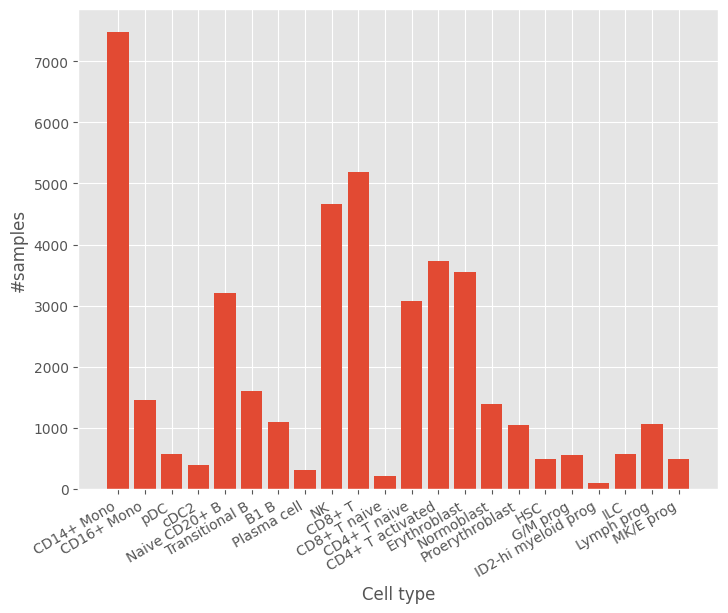

In [16]:
cells, counts = np.unique(Y_train, return_counts=True)
print(f"{np.sum(counts)} samples of {len(cells)} cells")
for missing_celltype in set(cell_types) - set(cells):
    cells = np.append(cells, missing_celltype)
    counts = np.append(counts, 0)

sorted_counts = counts[[np.where(np.isin(cells, c))[0][0] for c in cell_types_sorted]]

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(cell_types_sorted, sorted_counts)
plt.xticks(rotation=30, ha='right')
plt.xlabel("Cell type")
plt.ylabel("#samples")
plt.show()

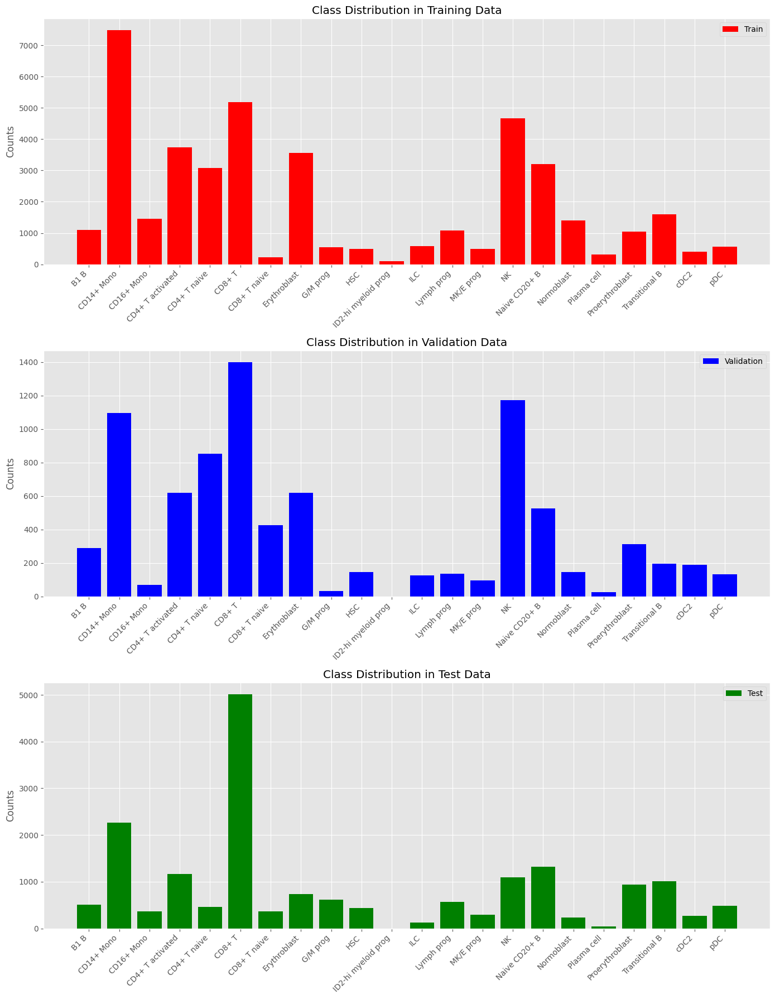

In [17]:
def get_class_distribution(y):
    unique, counts = np.unique(y, return_counts=True)
    return dict(zip(unique, counts))

train_dist = get_class_distribution(Y_train)
val_dist = get_class_distribution(Y_val)
test_dist = get_class_distribution(Y_test)


all_classes = sorted(set(train_dist.keys()).union(set(val_dist.keys()), set(test_dist.keys())))
class_to_index = {cls: idx for idx, cls in enumerate(all_classes)}

def prepare_plot_data(distribution):
    indices = []
    counts = []
    for cls in all_classes:
        indices.append(class_to_index[cls])
        counts.append(distribution.get(cls, 0))
    return indices, counts

train_indices, train_counts = prepare_plot_data(train_dist)
val_indices, val_counts = prepare_plot_data(val_dist)
test_indices, test_counts = prepare_plot_data(test_dist)

fig, ax = plt.subplots(3, 1, figsize=(14, 18))

ax[0].bar(train_indices, train_counts, color='r', label='Train')
ax[1].bar(val_indices, val_counts, color='b', label='Validation')
ax[2].bar(test_indices, test_counts, color='g', label='Test')

ax[0].set_title('Class Distribution in Training Data')
ax[1].set_title('Class Distribution in Validation Data')
ax[2].set_title('Class Distribution in Test Data')

ax[0].set_ylabel('Counts')
ax[1].set_ylabel('Counts')
ax[2].set_ylabel('Counts')

ax[0].legend()
ax[1].legend()
ax[2].legend()

for a in ax:
    a.set_xticks(range(len(all_classes)))
    a.set_xticklabels(all_classes, rotation=45, ha='right')
    a.tick_params(axis='x', labelbottom=True)

plt.tight_layout()
plt.show()

In [18]:
print(f"The sparsity of the train matrix is {(1 - X_train.nnz / (X_train.shape[0] * X_train.shape[1])) * 100:.2f}%")

The sparsity of the train matrix is 74.13%


# Model Training

## TPU initiation

In [19]:
resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
tf.config.experimental_connect_to_cluster(resolver)
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.TPUStrategy(resolver)

## Tuning with Hyperband

Callbacks

In [25]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=0.000001,
    verbose=1
)
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=6,
    restore_best_weights=True,
    verbose=1
)

In [23]:
def model_builder(hp):
    with strategy.scope():
        model = Sequential()
        units = hp.Int('units', min_value=len(np.unique(Y_train)), max_value=7*len(np.unique(Y_train)), step=len(np.unique(Y_train)))
        hp_alpha = hp.Float('alpha', min_value=0.0, max_value=0.1, step=0.01)
        hp_batch_size = hp.Choice('batch_size', values=[32, 64, 128, 256, 512])
        model.add(Dense(units=units, activation='relu', kernel_regularizer=l2(hp_alpha), input_dim=X_train_dense.shape[1]))
        model.add(Dense(num_classes, activation='softmax'))
        hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5, 1e-6])
        hp_optimizer = hp.Choice('optimizer', values=['adam', 'sgd'])
        if hp_optimizer == 'adam':
            optimizer = Adam(learning_rate=hp_learning_rate)
        else:
            hp_momentum = hp.Float('momentum', min_value=0.5, max_value=0.99, step=0.1)
            optimizer = SGD(learning_rate=hp_learning_rate, momentum=hp_momentum)
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=[SparseCategoricalAccuracy()])
        return model

In [ ]:
with strategy.scope():
    tuner = Hyperband(
        model_builder,
        objective='val_sparse_categorical_accuracy',
        max_epochs=70,
        factor=3,
        hyperband_iterations=2,
        directory='BMMC_final',
        project_name='BMMC_final',
        overwrite=True
    )
    tuner.search(X_train_dense, Y_train_encoded, epochs=10, validation_data=(X_val_dense, Y_val_encoded), callbacks=[reduce_lr, early_stopping])
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


### Backup tuning to drive

In [ ]:
src_folder = '/content/BMMC_final'
dest_folder = '/content/drive/MyDrive/Design/BMMC_final

shutil.copytree(src_folder, dest_folder)

### Load tuning from drive

In [ ]:
src_folder = '/content/drive/MyDrive/Design/BMMC_final'
dest_folder = '/content/BMMC_final'

shutil.copytree(src_folder, dest_folder)

In [ ]:
with strategy.scope():
    tuner = Hyperband(
        model_builder,
        objective='val_sparse_categorical_accuracy',
        max_epochs=70,
        factor=3,
        hyperband_iterations=2,
        directory='BMMC_final',
        project_name='BMMC_final',
        overwrite=False
    )
    tuner.search(X_train_dense, Y_train_encoded, epochs=10, validation_data=(X_val_dense, Y_val_encoded), callbacks=[reduce_lr, early_stopping])
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [27]:
print(f"Optimal number of units: {best_hps.get('units')}")
print(f"Optimal alpha for L2 regularization: {best_hps.get('alpha')}")
print(f"Optimal batch size: {best_hps.get('batch_size')}")
print(f"Optimal learning rate: {best_hps.get('learning_rate')}")
print(f"Optimal optimizer: {best_hps.get('optimizer')}")
if best_hps.get('optimizer') == 'sgd':
    print(f"Optimal momentum for SGD: {best_hps.get('momentum')}")

Optimal number of units: 110
Optimal alpha for L2 regularization: 0.02
Optimal batch size: 512
Optimal learning rate: 0.001
Optimal optimizer: sgd
Optimal momentum for SGD: 0.8


# Resplit the data to Train/ Test

In order to train on the full training set without validation using the best hyperparameters found during tuning.
This is not ideal, as the tuning process selects the best HP forthe validation set. However this gives a better results then choosing HP without validation at all.

In [20]:
test_donors_idx = [19593, 28045, 28483]
test_filter = np.isin(BMMC.obs['DonorID'], test_donors_idx)

train_filter_idx = [10886,16710,11466,13272,15078,12710, 18303]
train_filter = np.isin(BMMC.obs['DonorID'], train_filter_idx)

n_train = np.sum(train_filter)
n_test = np.sum(test_filter)

X_test = BMMC.obsm['ATAC_gene_activity'][test_filter]
X_train = BMMC.obsm['ATAC_gene_activity'][train_filter]

Y_test = BMMC.obs['cell_type'][test_filter]
Y_train = BMMC.obs['cell_type'][train_filter]

train_donors = BMMC.obs[train_filter]['DonorID']
test_donors = BMMC.obs[test_filter]['DonorID']

Y_train_encoded = label_encoder.transform(Y_train)
Y_test_encoded = label_encoder.transform(Y_test)

X_train_dense = sparse_to_dense(X_train)
X_test_dense = sparse_to_dense(X_test)

num_classes = len(np.unique(Y_train_encoded))

print(f"{n_train} train samples")
print(f"{n_val} validation samples")
print(f"{n_test} test samples")
print(f"{n_train/(n_train+n_val+n_test)*100:.2f}% of samples used for training")
print(f"{n_val/(n_train+n_val+n_test)*100:.2f}% of samples used for validation")
print(f"{n_test/(n_train+n_val+n_test)*100:.2f}% of samples used for testing")

50913 train samples
8604 validation samples
18336 test samples
65.40% of samples used for training
11.05% of samples used for validation
23.55% of samples used for testing


### Split distribution

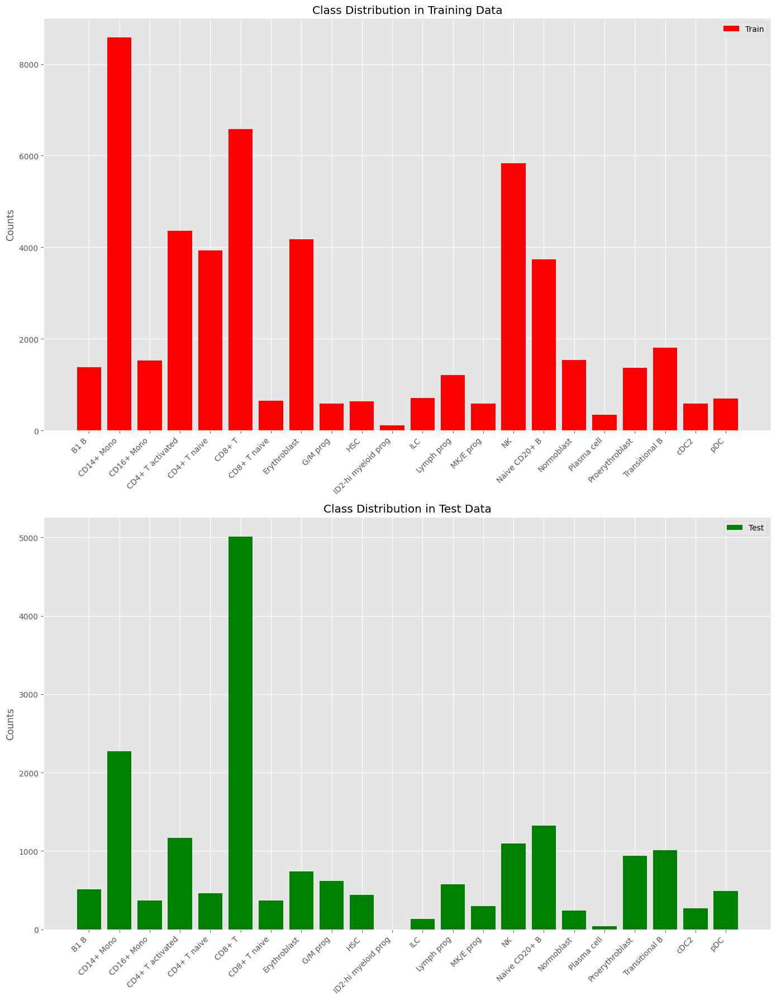

In [ ]:
train_dist = get_class_distribution(Y_train)
test_dist = get_class_distribution(Y_test)


all_classes = sorted(set(train_dist.keys()).union(set(test_dist.keys())))
class_to_index = {cls: idx for idx, cls in enumerate(all_classes)}

train_indices, train_counts = prepare_plot_data(train_dist)
test_indices, test_counts = prepare_plot_data(test_dist)

fig, ax = plt.subplots(2, 1, figsize=(14, 18))

ax[0].bar(train_indices, train_counts, color='r', label='Train')
ax[1].bar(test_indices, test_counts, color='g', label='Test')

ax[0].set_title('Class Distribution in Training Data')
ax[1].set_title('Class Distribution in Test Data')

ax[0].set_ylabel('Counts')
ax[1].set_ylabel('Counts')

ax[0].legend()
ax[1].legend()

for a in ax:
    a.set_xticks(range(len(all_classes)))
    a.set_xticklabels(all_classes, rotation=45, ha='right')
    a.tick_params(axis='x', labelbottom=True)

plt.tight_layout()
plt.show()

In [ ]:
print(f"The sparsity of the train matrix is {(1 - X_train.nnz / (X_train.shape[0] * X_train.shape[1])) * 100:.2f}%")

The sparsity of the train matrix is 72.35%


# Final model training with best HP

In [ ]:
def final_model(input_shape, num_classes, best_hps):
    model = Sequential([
        Dense(best_hps.get('units'), activation='relu', kernel_regularizer=l2(best_hps.get('alpha')), input_dim=input_shape),
        Dense(num_classes, activation='softmax')
    ])
    if best_hps.get('optimizer') == 'adam':
        optimizer = Adam(learning_rate=best_hps.get('learning_rate'))
    else:
        optimizer = SGD(learning_rate=best_hps.get('learning_rate'), momentum=best_hps.get('momentum'))

    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=[SparseCategoricalAccuracy()])
    return model

with strategy.scope():
    model = final_model(X_train_dense.shape[1], num_classes, best_hps)
    model.fit(X_train_dense, Y_train_encoded, epochs=70, batch_size = best_hps.get('batch_size'))



model_save_path = '/content/drive/MyDrive/Design/BMMC/BMMC_MLP.keras'
model.save(model_save_path)

## Model re-loading

In [ ]:
model_load_path = '/content/drive/MyDrive/Design/BMMC/BMMC_MLP.keras'
model = load_model(model_load_path)

if best_hps.get('optimizer') == 'adam':
    optimizer = Adam(learning_rate=best_hps.get('learning_rate'))
else:
    optimizer = SGD(learning_rate=best_hps.get('learning_rate'), momentum=best_hps.get('momentum'))

model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=[SparseCategoricalAccuracy()])

# Predictions

In [29]:
test_loss, test_accuracy = model.evaluate(X_test_dense, Y_test_encoded)

test_pred = model.predict(X_test_dense).argmax(axis=1)
train_pred = model.predict(X_train_dense).argmax(axis=1)
full_pred = model.predict(X_full_dense).argmax(axis=1)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


2165/2165 [==============================] - 5s 2ms/step
Test Loss: 0.6502999663352966
Test Accuracy: 0.8462586998939514


In [30]:
test_pred_labels = label_encoder.inverse_transform(test_pred)
train_pred_labels = label_encoder.inverse_transform(train_pred)
full_pred_labels = label_encoder.inverse_transform(full_pred)

pred_pickle = {
    'test_pred_labels': test_pred_labels,
    'train_pred_labels': train_pred_labels,
    'full_pred_labels': full_pred_labels
}

file_path = '/content/drive/MyDrive/Design/BMMC/bmmc_pred.pkl'

with open(file_path, 'wb') as file:
    pickle.dump(pred_pickle, file)

# Model Analysis

In [31]:
def to_main_cell_types(cell_type_labels, label_encoder):
    cell_type_decoded = label_encoder.inverse_transform(cell_type_labels)
    return np.array([main_cell_types_mapping.get(label, label) for label in cell_type_decoded])

Y_test_main = to_main_cell_types(Y_test_encoded, label_encoder)
Y_train_main = to_main_cell_types(Y_train_encoded, label_encoder)
test_main_pred = to_main_cell_types(test_pred, label_encoder)
train_main_pred = to_main_cell_types(train_pred, label_encoder)

In [32]:
print("==== With Subtypes ====")
print(f"Train accuracy: {accuracy_score(Y_train_encoded, train_pred):.5f}")
print(f"Test accuracy: {accuracy_score(Y_test_encoded, test_pred):.5f}")
print("")
print(f"Balanced Train Accuracy: {balanced_accuracy_score(Y_train_encoded, train_pred):.5f}")
print(f"Balanced Test Accuracy: {balanced_accuracy_score(Y_test_encoded, test_pred):.5f}")
print("")
print("==== Main celltypes ====")
print(f"Train accuracy: {accuracy_score(Y_train_main, train_main_pred):.5f}")
print(f"Test accuracy: {accuracy_score(Y_test_main, test_main_pred):.5f}")
print("")
print(f"Balanced Train Accuracy: {balanced_accuracy_score(Y_train_main, train_main_pred):.5f}")
print(f"Balanced Test Accuracy: {balanced_accuracy_score(Y_test_main, test_main_pred):.5f}")

==== With Subtypes ====
Train accuracy: 0.93784
Test accuracy: 0.84626

Balanced Train Accuracy: 0.92392
Balanced Test Accuracy: 0.74242

==== Main celltypes ====
Train accuracy: 0.98594
Test accuracy: 0.94928

Balanced Train Accuracy: 0.97124
Balanced Test Accuracy: 0.91069


In [33]:
Y_test_decoded = label_encoder.inverse_transform(Y_test_encoded)
test_pred_decoded = label_encoder.inverse_transform(test_pred)
print(classification_report(Y_test_decoded, test_pred_decoded))

                  precision    recall  f1-score   support

            B1 B       0.95      0.69      0.80       508
      CD14+ Mono       0.92      0.95      0.93      2269
      CD16+ Mono       0.82      0.92      0.87       370
CD4+ T activated       0.68      0.71      0.70      1167
    CD4+ T naive       0.39      0.46      0.42       463
          CD8+ T       0.91      0.95      0.93      5009
    CD8+ T naive       0.34      0.21      0.26       366
    Erythroblast       0.89      0.89      0.89       741
        G/M prog       0.70      0.46      0.55       617
             HSC       0.67      0.84      0.74       437
             ILC       0.67      0.09      0.16       129
      Lymph prog       0.93      0.75      0.83       573
       MK/E prog       0.77      0.72      0.74       293
              NK       0.89      0.90      0.90      1092
   Naive CD20+ B       0.81      0.98      0.89      1322
      Normoblast       0.98      0.81      0.89       237
     Plasma c

In [34]:
print(classification_report(Y_test_main, test_main_pred))

                                                   precision    recall  f1-score   support

                                          B Cells       0.95      0.98      0.97      2876
Erythrocytes (RBCs), Eosinophils, and Neutrophils       0.97      0.95      0.96      1916
         Hematopoietic Stem Cells and Progenitors       0.93      0.78      0.85      2049
                                        Monocytes       0.93      0.98      0.95      2639
                          Myeloid Dendritic Cells       0.85      0.72      0.78       269
                                         NK Cells       0.89      0.90      0.90      1092
                     Plasmacytoid Dendritic Cells       0.96      0.99      0.98       490
                                          T Cells       0.96      0.99      0.98      7005

                                         accuracy                           0.95     18336
                                        macro avg       0.93      0.91      0.92     183

## Confusion Matrices

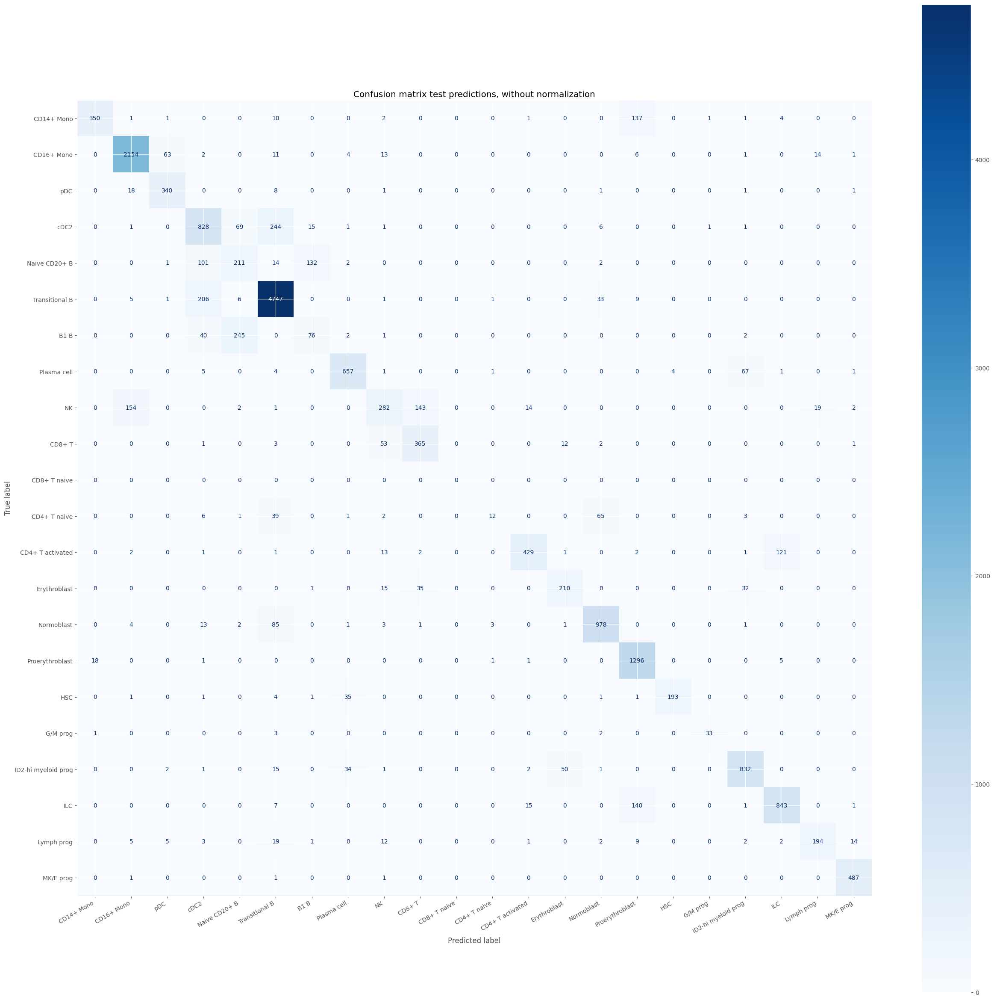

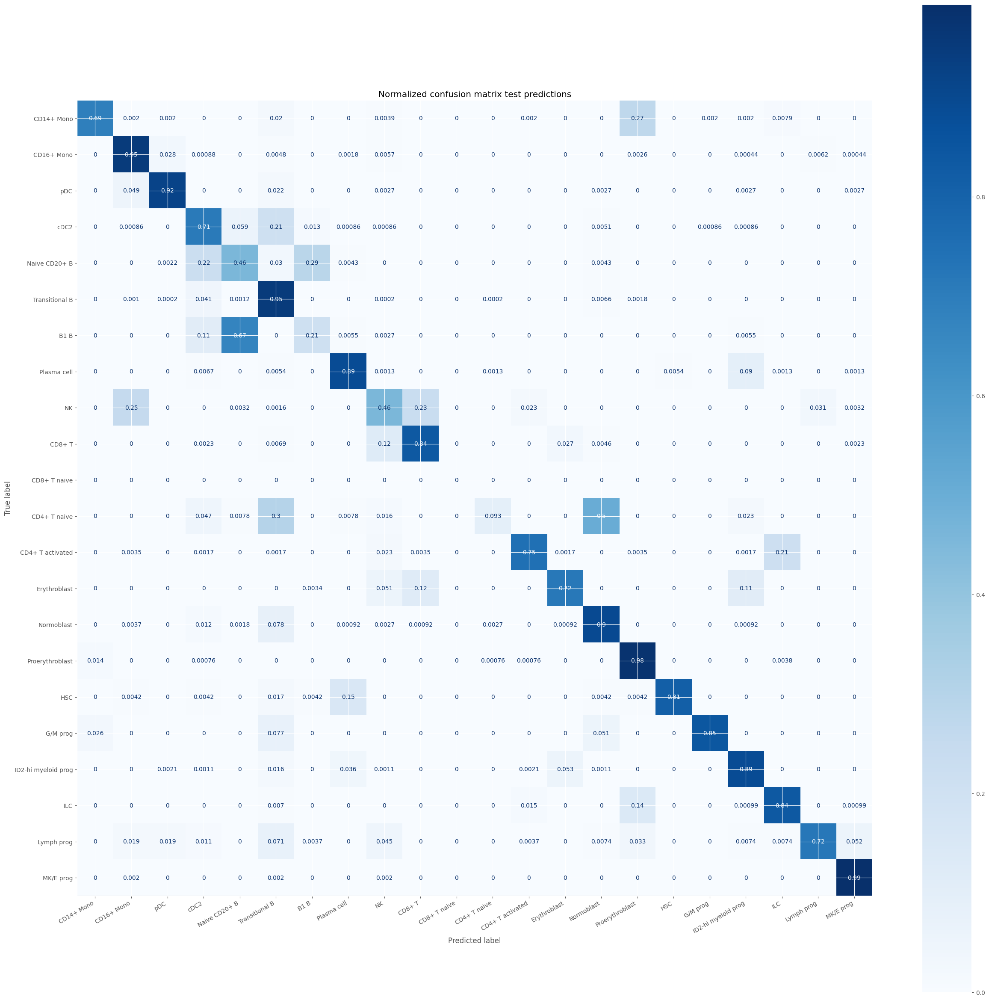

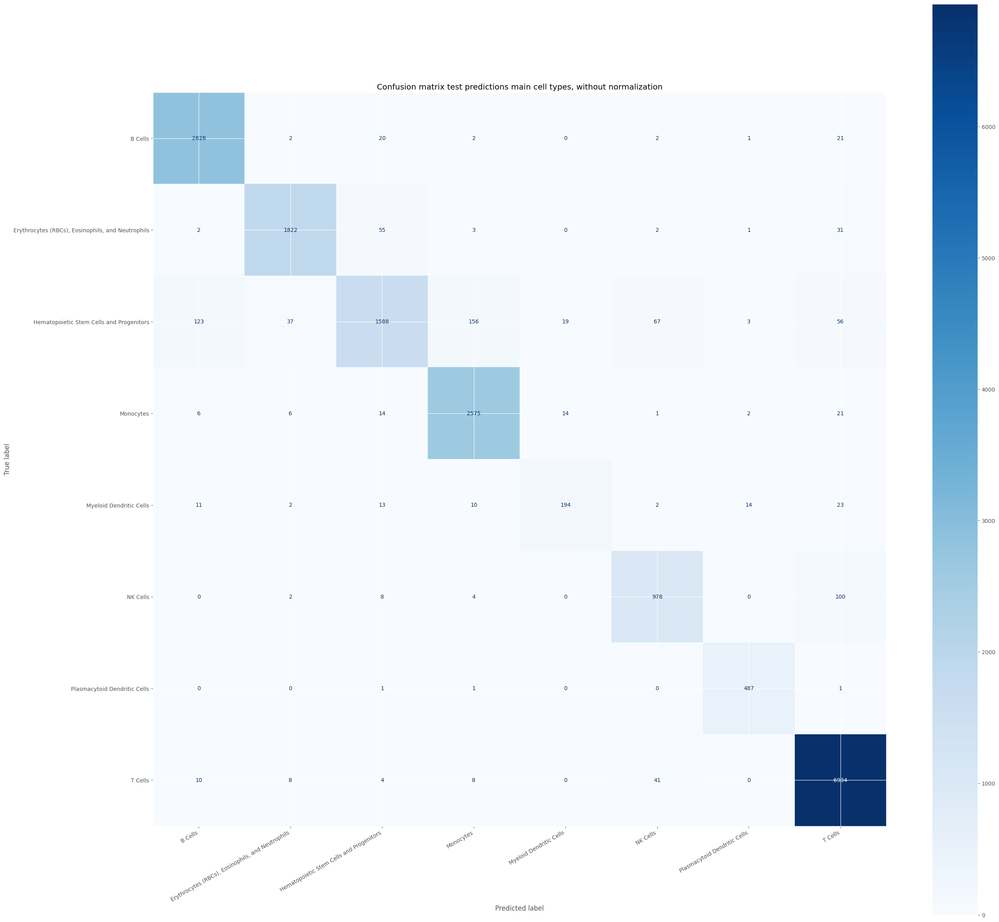

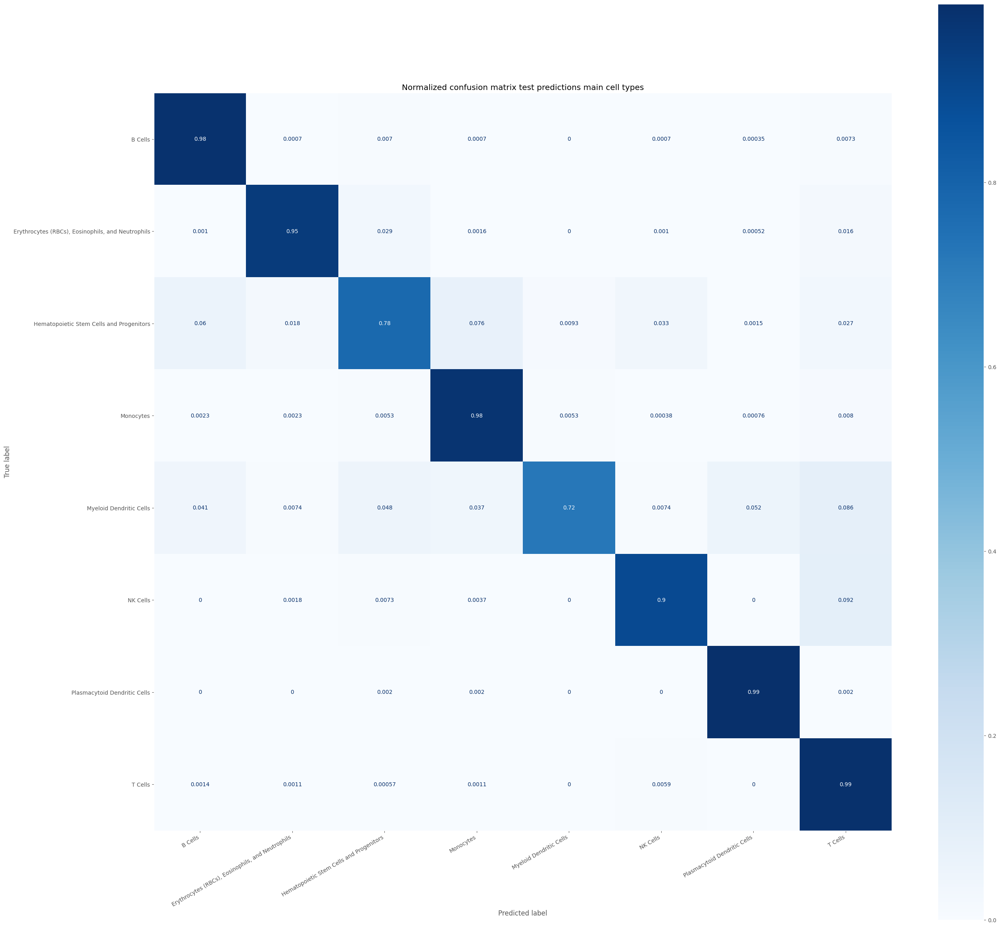

In [35]:
np.set_printoptions(precision=2)

titles_options = [
    ("Confusion matrix test predictions, without normalization", None, test_pred_decoded, Y_test_decoded, cell_types_sorted),
    ("Normalized confusion matrix test predictions", "true", test_pred_decoded, Y_test_decoded, cell_types_sorted),
    ("Confusion matrix test predictions main cell types, without normalization", None, test_main_pred, Y_test_main, main_cell_types_sorted),
    ("Normalized confusion matrix test predictions main cell types", "true", test_main_pred, Y_test_main, main_cell_types_sorted),
]

plt.rcParams['figure.figsize'] = [30, 30]
for title, normalize, pred, true_labels, celltypes in titles_options:
    disp = ConfusionMatrixDisplay.from_predictions(
        true_labels,
        pred,
        display_labels=celltypes,
        cmap=plt.cm.Blues,
        normalize=normalize,
        labels=np.unique(celltypes)
    )
    plt.xticks(rotation=30, ha='right')
    disp.ax_.set_title(title)

plt.grid(False)
plt.show()


## Umaps

In [36]:
umap_coordinates_train = BMMC.obsm['ATAC_umap'][train_filter]
umap_coordinates_test = BMMC.obsm['ATAC_umap'][test_filter]

In [37]:
def show_umap(_celltypes, _umapcoords, labels, title='UMAP Plot observations', s=10):
    """Display a UMAP plot for given cell types and coordinates."""
    plt.figure(figsize=(30, 30))
    colors = plt.colormaps['viridis'](np.linspace(0, 1, len(_celltypes)))
    for i, ct_ in enumerate(_celltypes):
        mask = np.array(labels) == ct_
        if np.any(mask):
            plt.scatter(_umapcoords[mask, 0], _umapcoords[mask, 1], label=ct_, color=colors[i], s=s)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title)
    plt.legend(title='Cell Type', loc='upper right')
    plt.show()

def show_predictions_umap(_umapcoords, _predictions, _labels, label_encoder, _maincelltypes=False, title='UMAP Plot prediction accuracy', s=10):
    plt.figure(figsize=(30, 30))

    labels_decoded = label_encoder.inverse_transform(_labels)
    predictions_decoded = label_encoder.inverse_transform(_predictions)

    if _maincelltypes:
        labels_main = [main_cell_types_mapping[label] for label in labels_decoded]
        predictions_main = [main_cell_types_mapping[label] for label in predictions_decoded]
    else:
        labels_main = labels_decoded
        predictions_main = predictions_decoded

    RightPred_mask = np.array(predictions_decoded) == np.array(labels_decoded)
    plt.scatter(_umapcoords[RightPred_mask, 0], _umapcoords[RightPred_mask, 1], label="Correct Prediction", color='green', s=s)

    WrongPred_Mask = np.array(predictions_decoded) != np.array(labels_decoded)

    CorrectMainType_WrongSubtype = (np.array(predictions_main) == np.array(labels_main)) & WrongPred_Mask
    plt.scatter(_umapcoords[CorrectMainType_WrongSubtype, 0], _umapcoords[CorrectMainType_WrongSubtype, 1], label="Correct Main Type, Wrong Subtype", color='blue', s=s)

    FullyWrongPred_Mask = (np.array(predictions_main) != np.array(labels_main))
    plt.scatter(_umapcoords[FullyWrongPred_Mask, 0], _umapcoords[FullyWrongPred_Mask, 1], label="Fully Wrong Prediction", color='red', s=s)

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title)
    plt.legend(title='Prediction Accuracy', loc='upper right')
    plt.show()

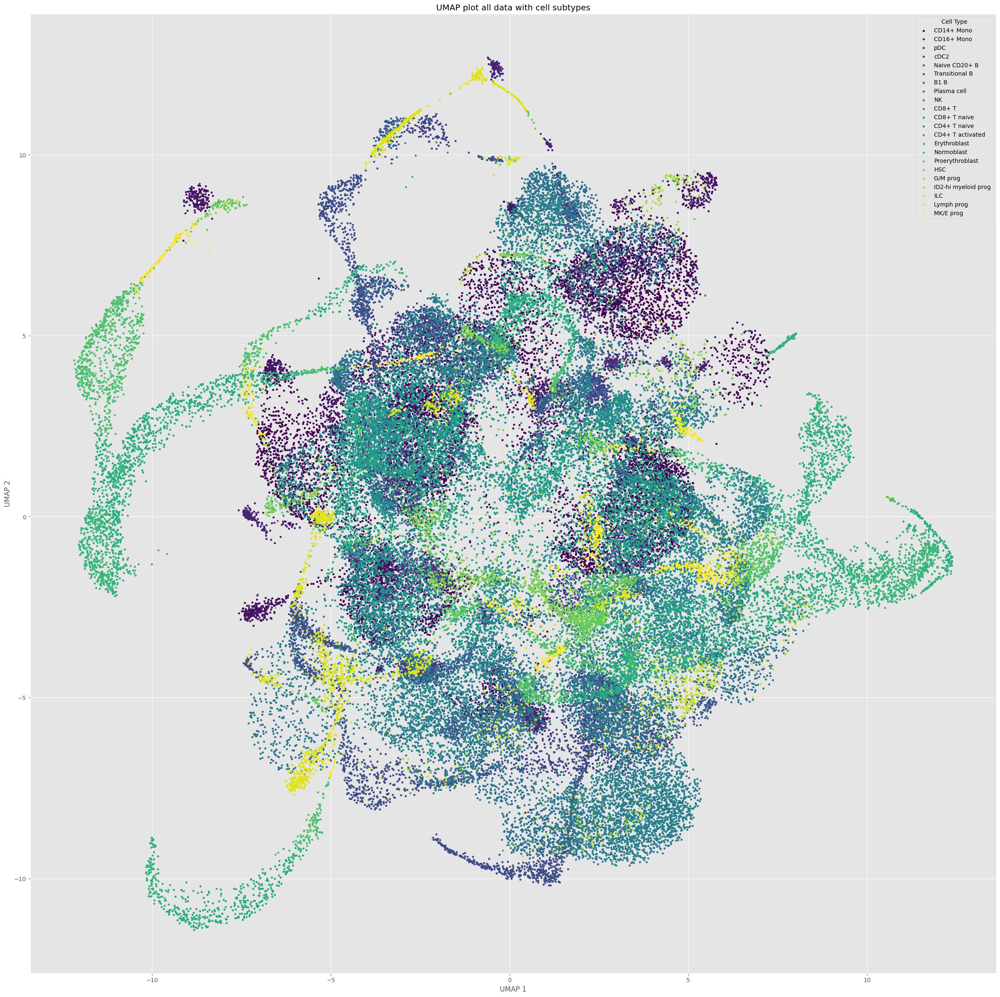

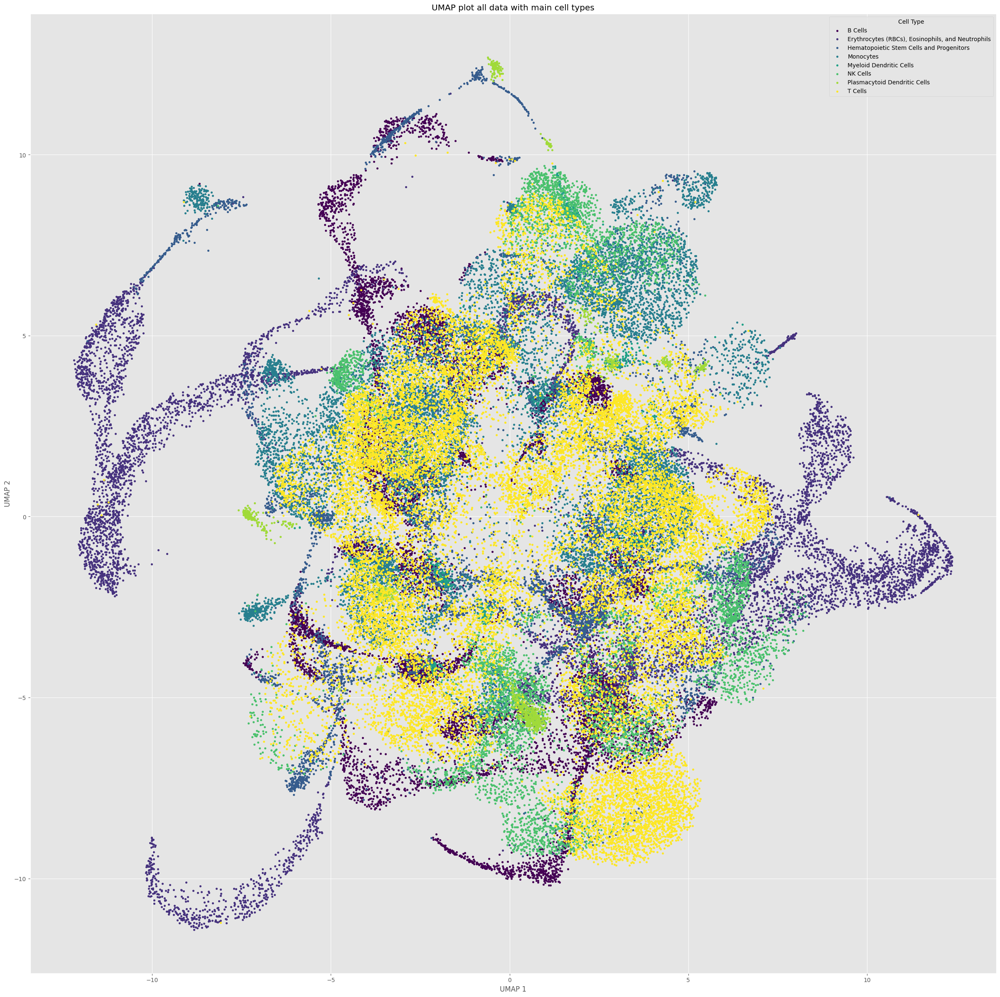

In [38]:
show_umap(cell_types_sorted, BMMC.obsm['ATAC_umap'], BMMC.obs['cell_type'].astype(str), title="UMAP plot all data with cell subtypes")
show_umap(main_cell_types_sorted, BMMC.obsm['ATAC_umap'], [main_cell_types_mapping.get(ct, ct) for ct in BMMC.obs['cell_type'].astype(str)], title="UMAP plot all data with main cell types")


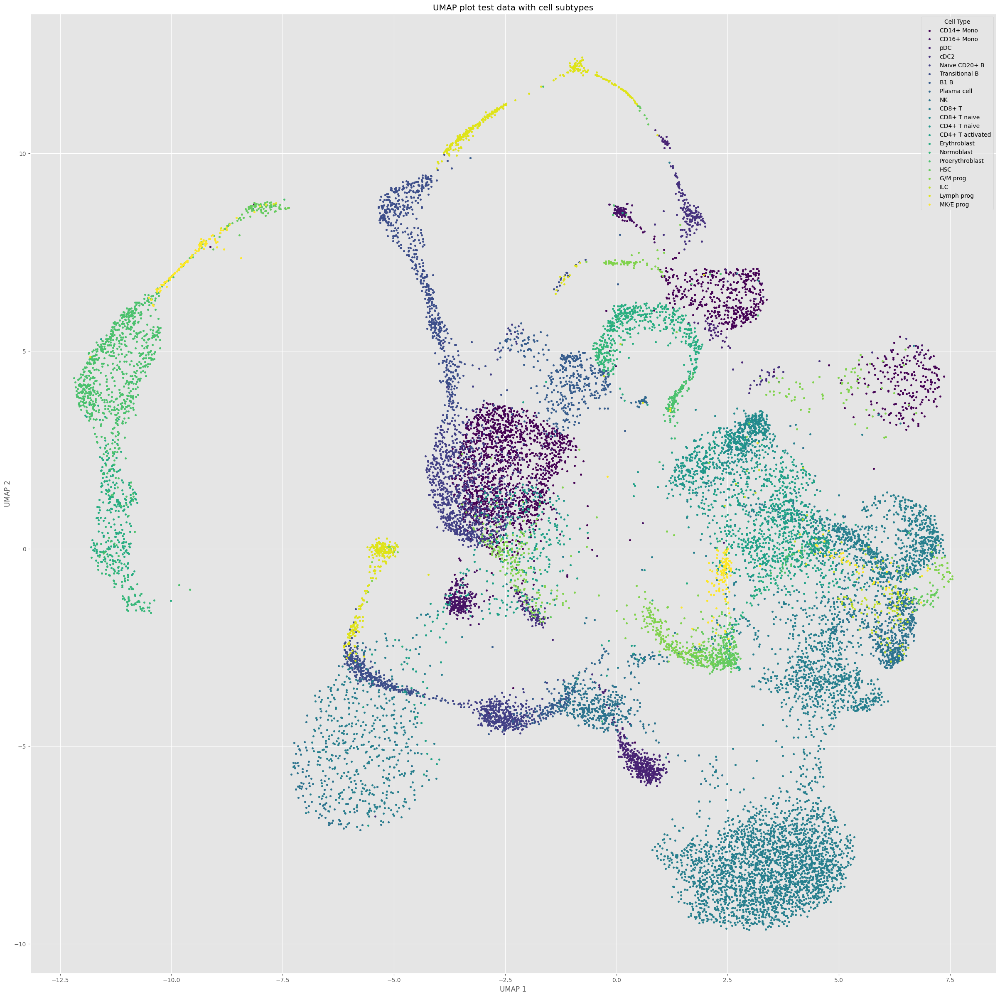

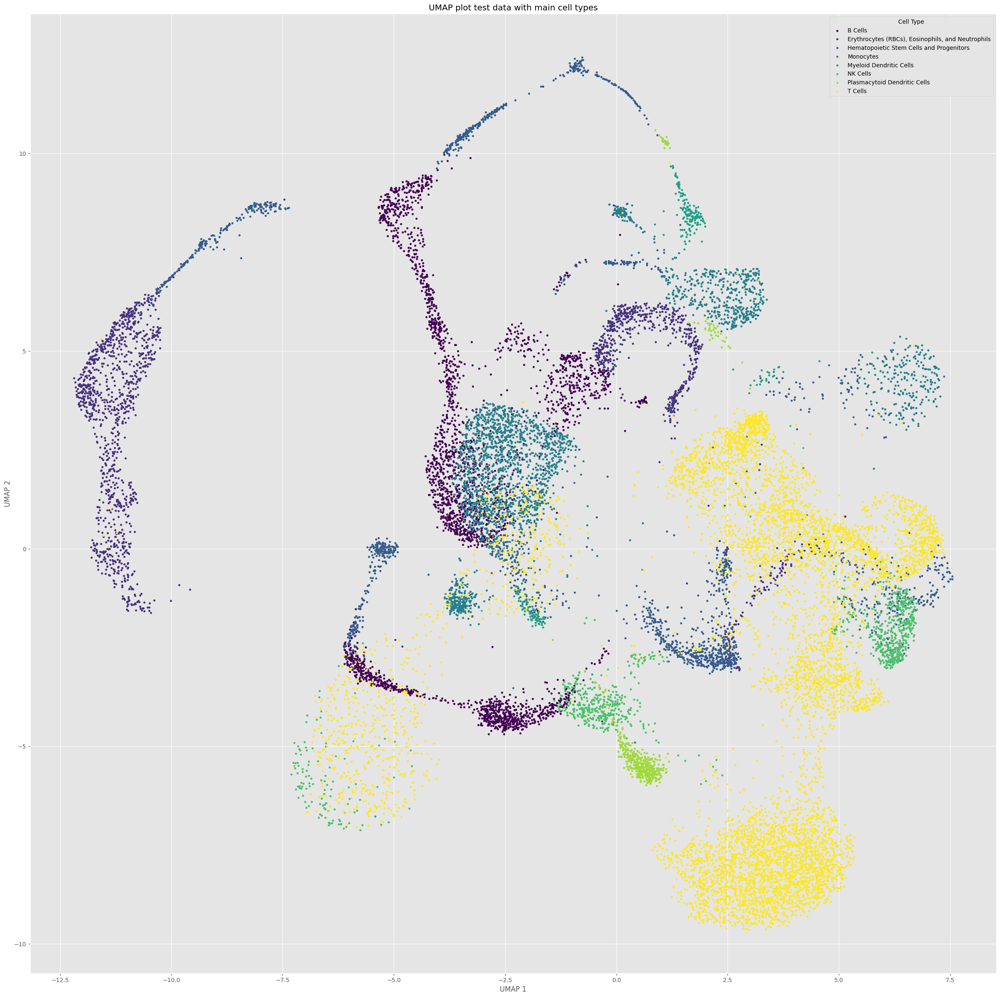

In [39]:
show_umap(cell_types_sorted, umap_coordinates_test, Y_test.astype(str), title="UMAP plot test data with cell subtypes")
show_umap(main_cell_types_sorted, umap_coordinates_test, [main_cell_types_mapping.get(label_encoder.inverse_transform([y])[0], label_encoder.inverse_transform([y])[0]) for y in Y_test_encoded], title="UMAP plot test data with main cell types")


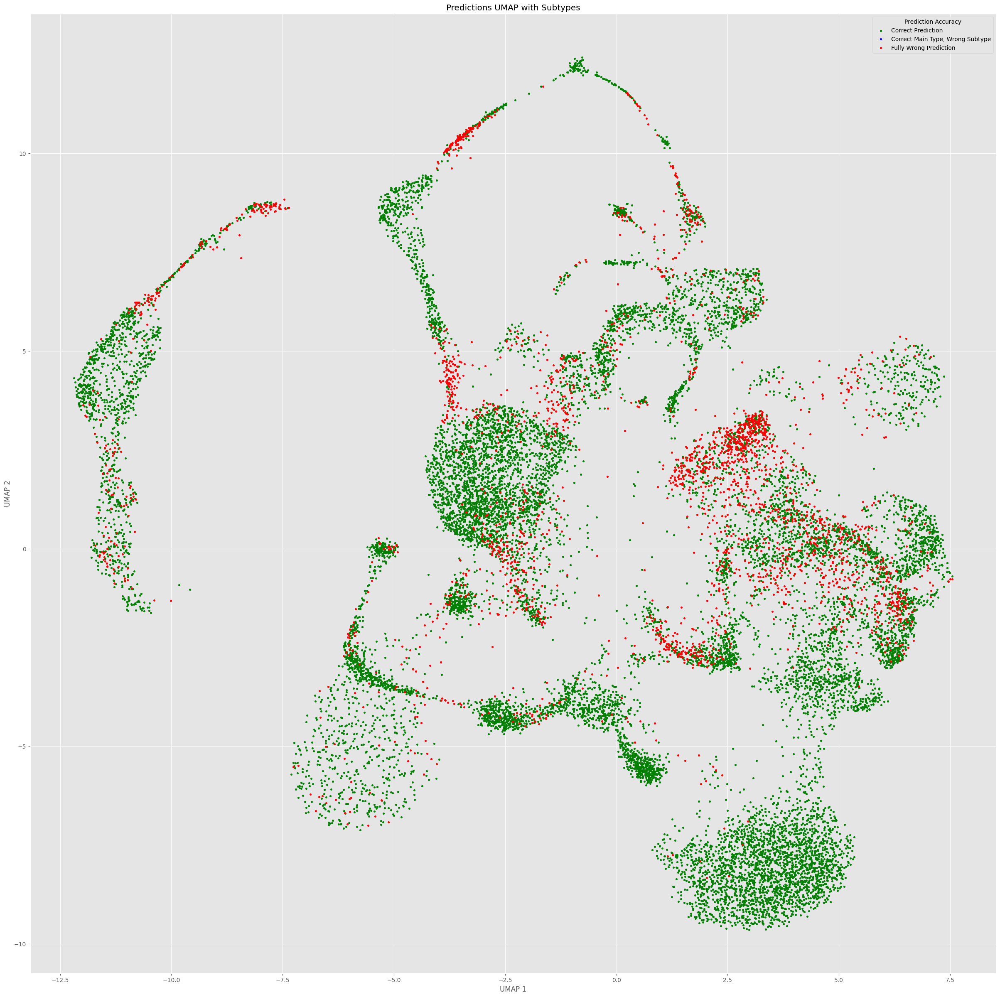

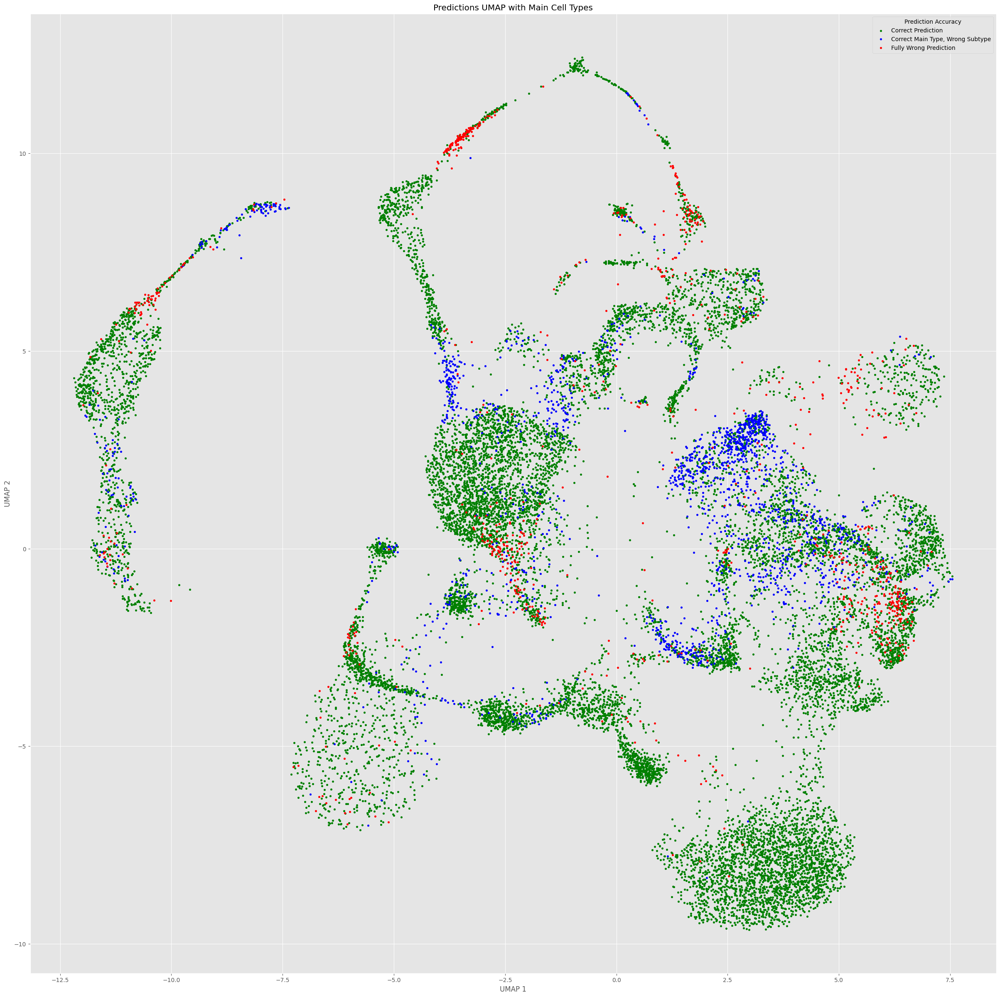

In [40]:
show_predictions_umap(umap_coordinates_test, test_pred, Y_test_encoded, label_encoder, title="Predictions UMAP with Subtypes", s=10)
show_predictions_umap(umap_coordinates_test, test_pred, Y_test_encoded, label_encoder, _maincelltypes=True, title="Predictions UMAP with Main Cell Types", s=10)

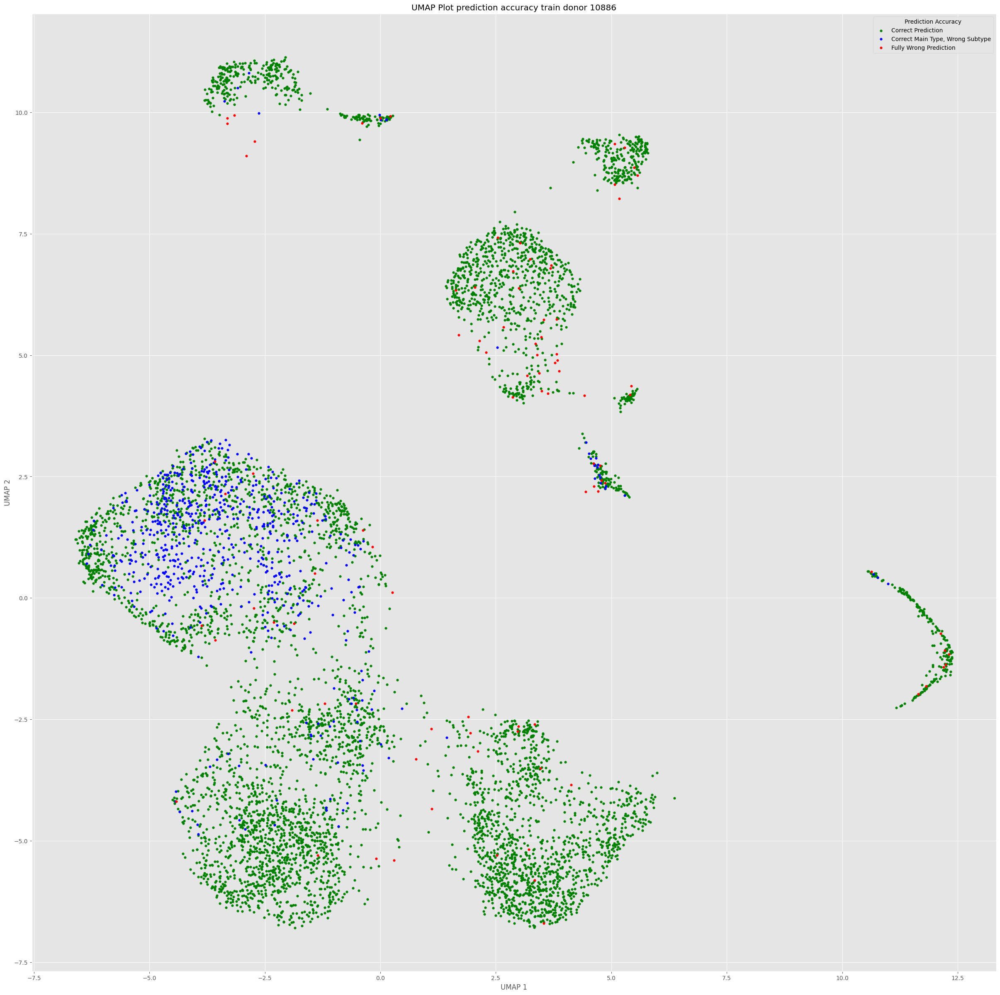

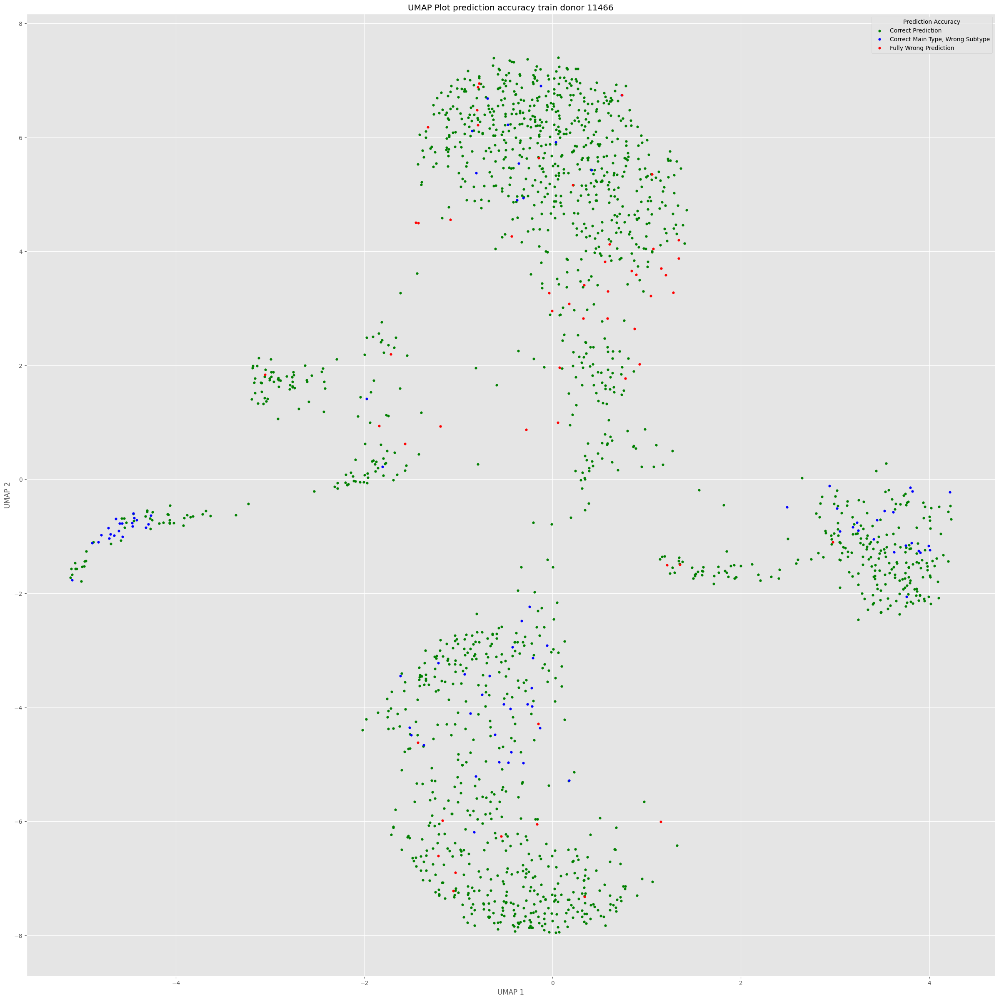

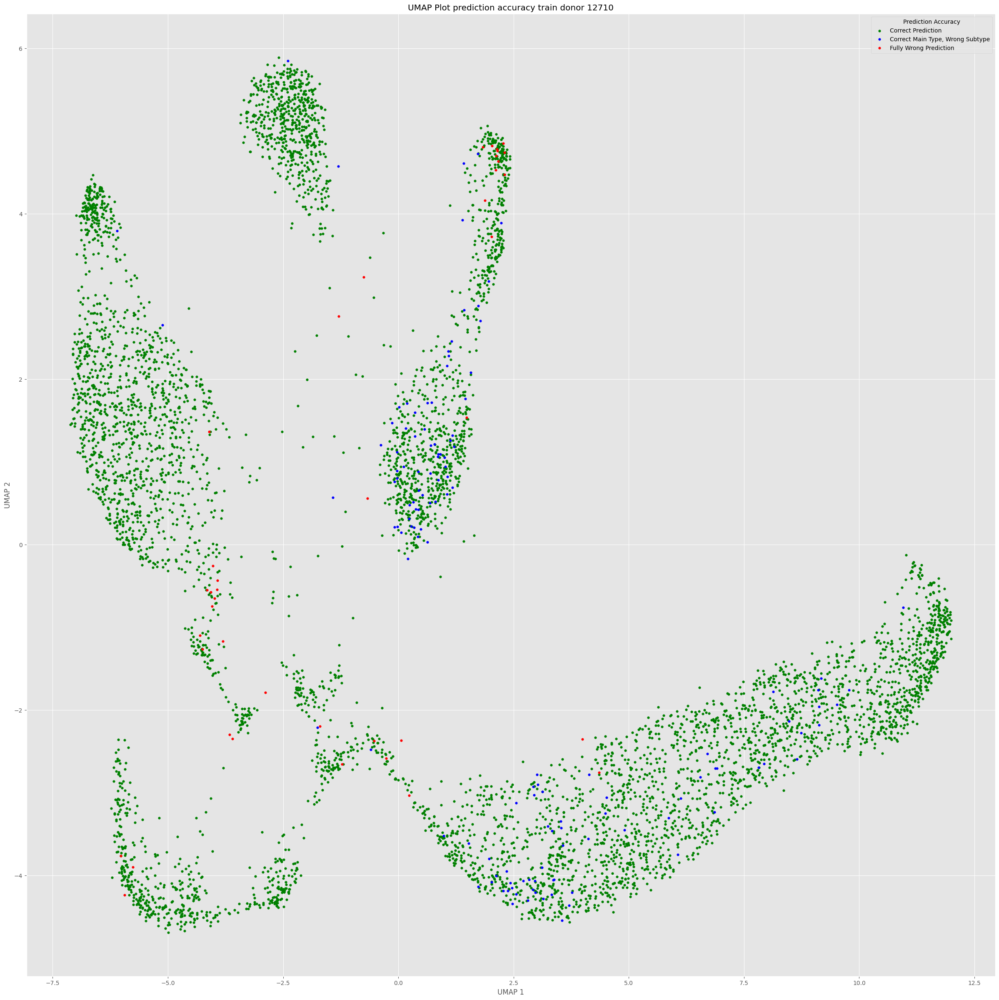

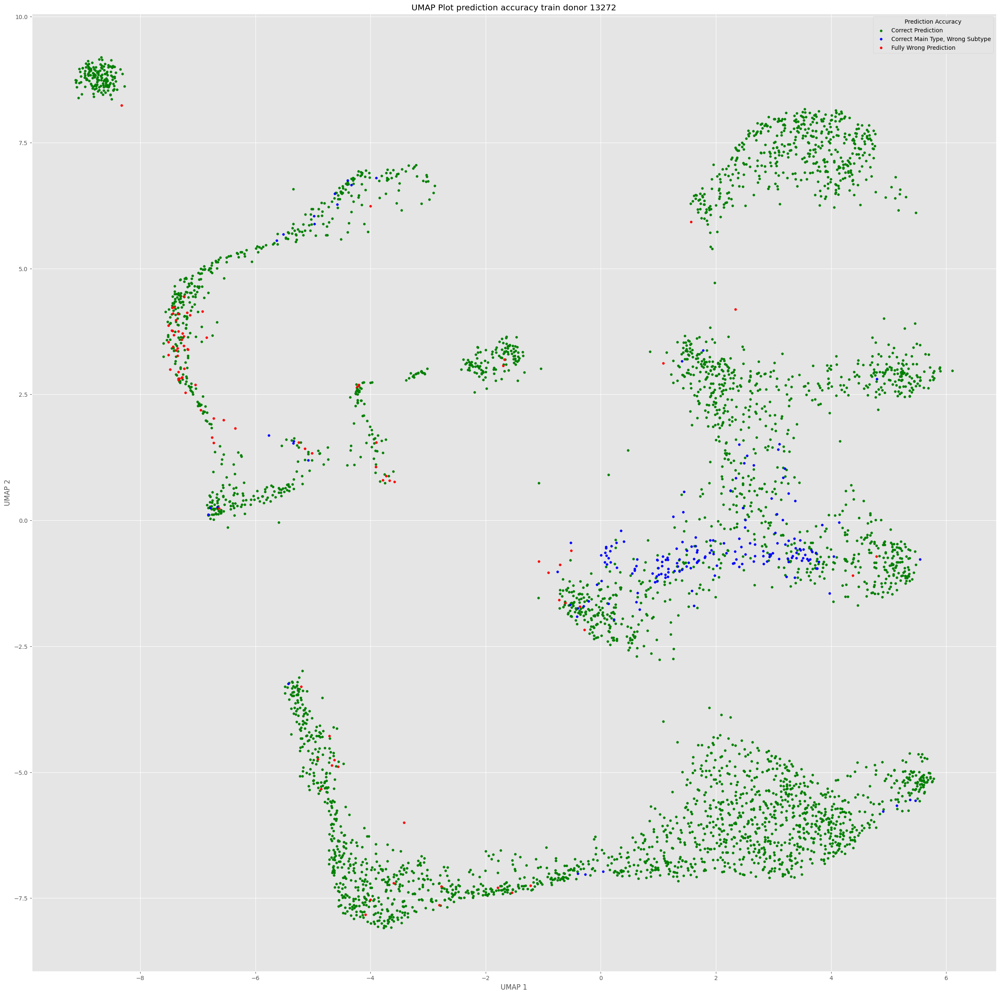

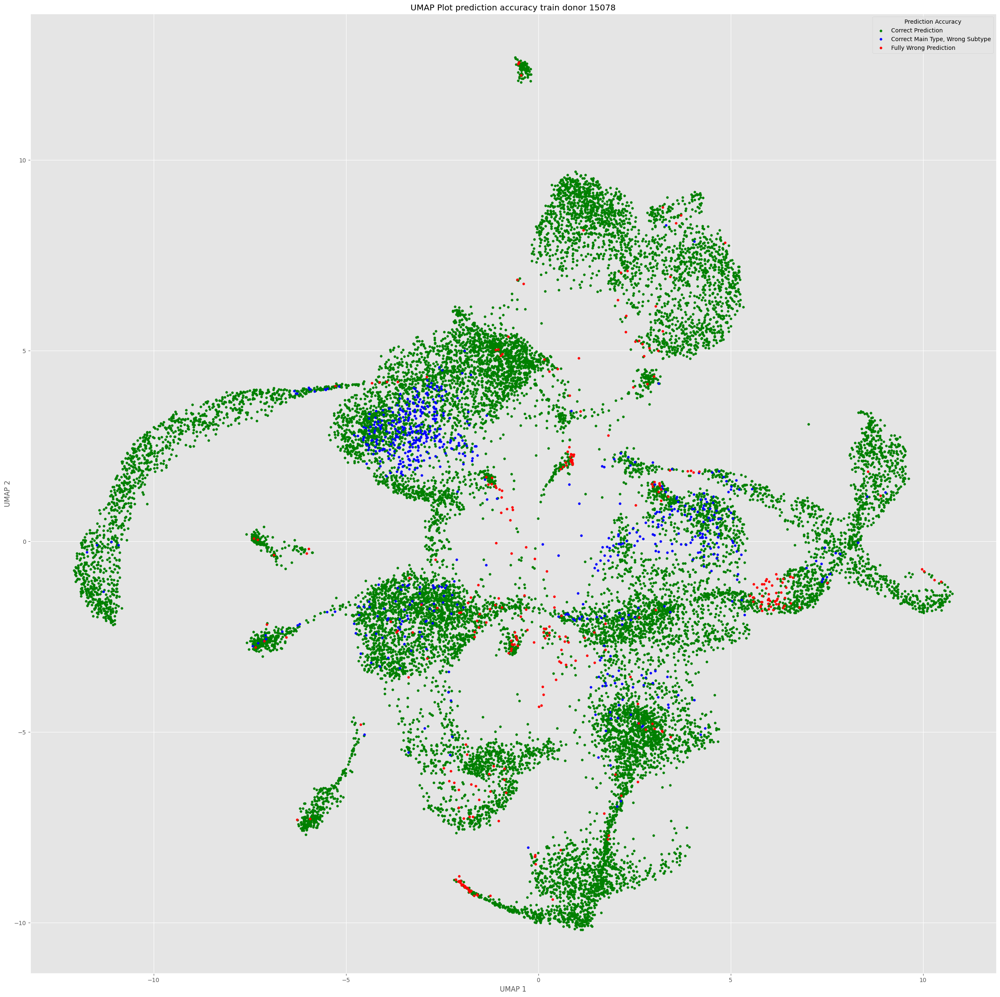

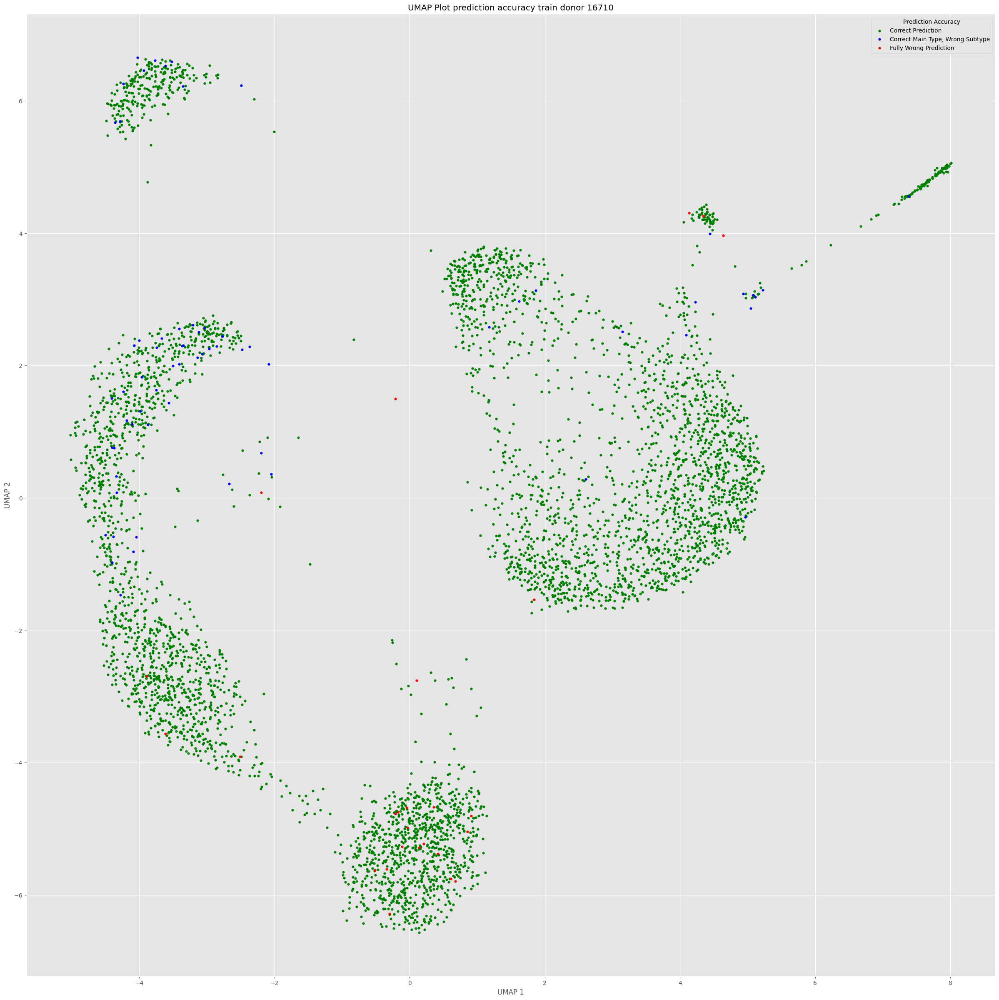

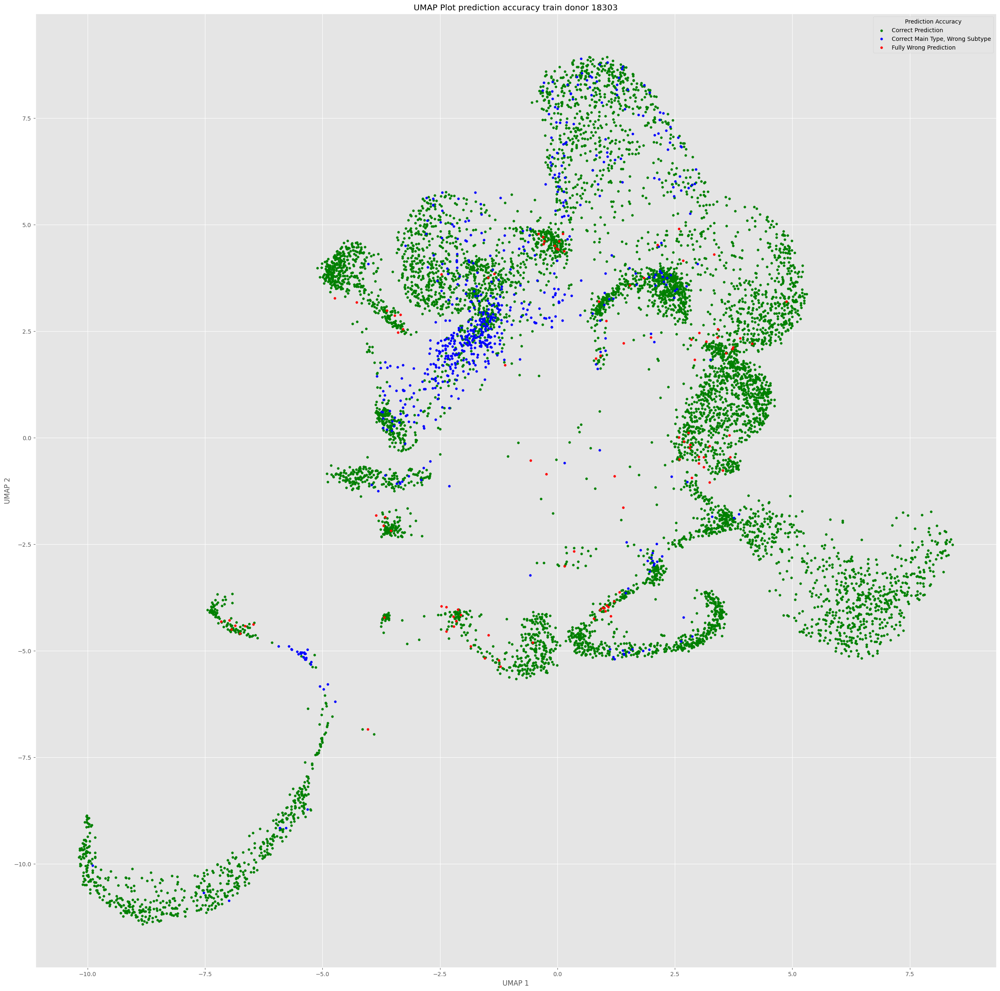

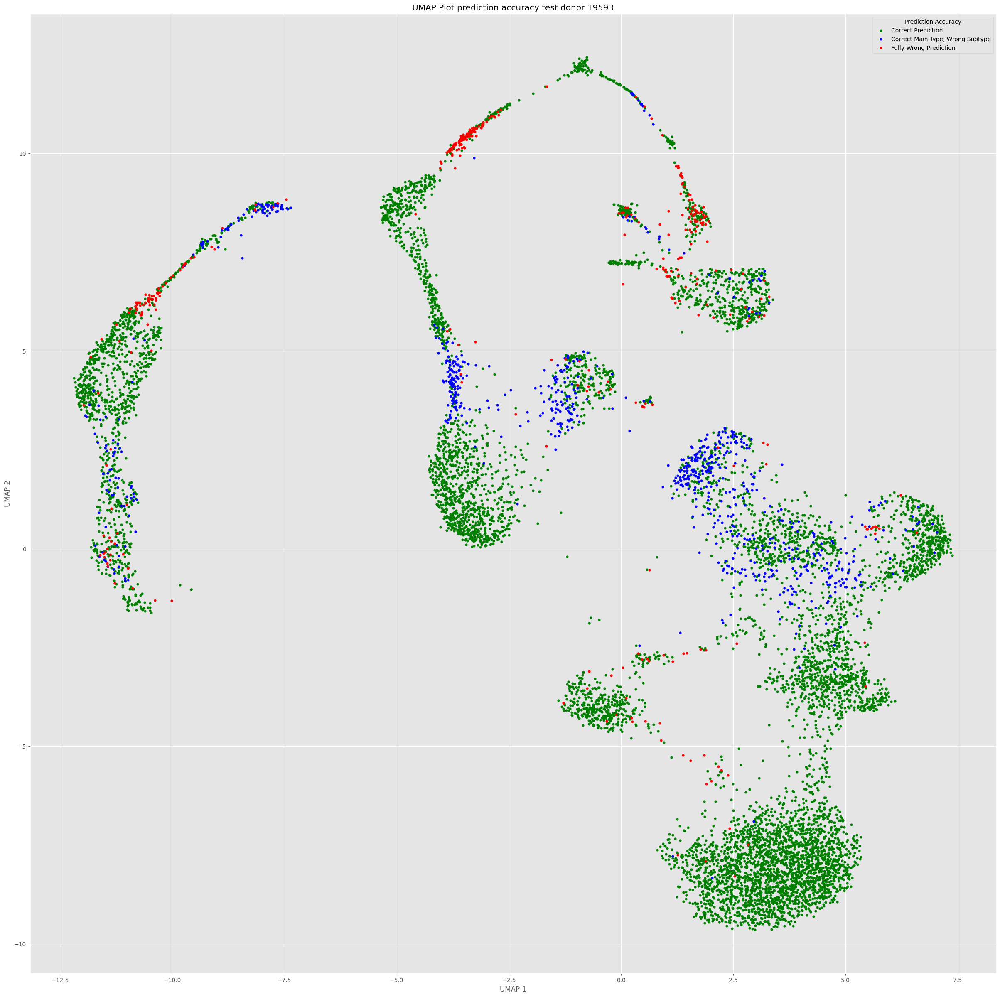

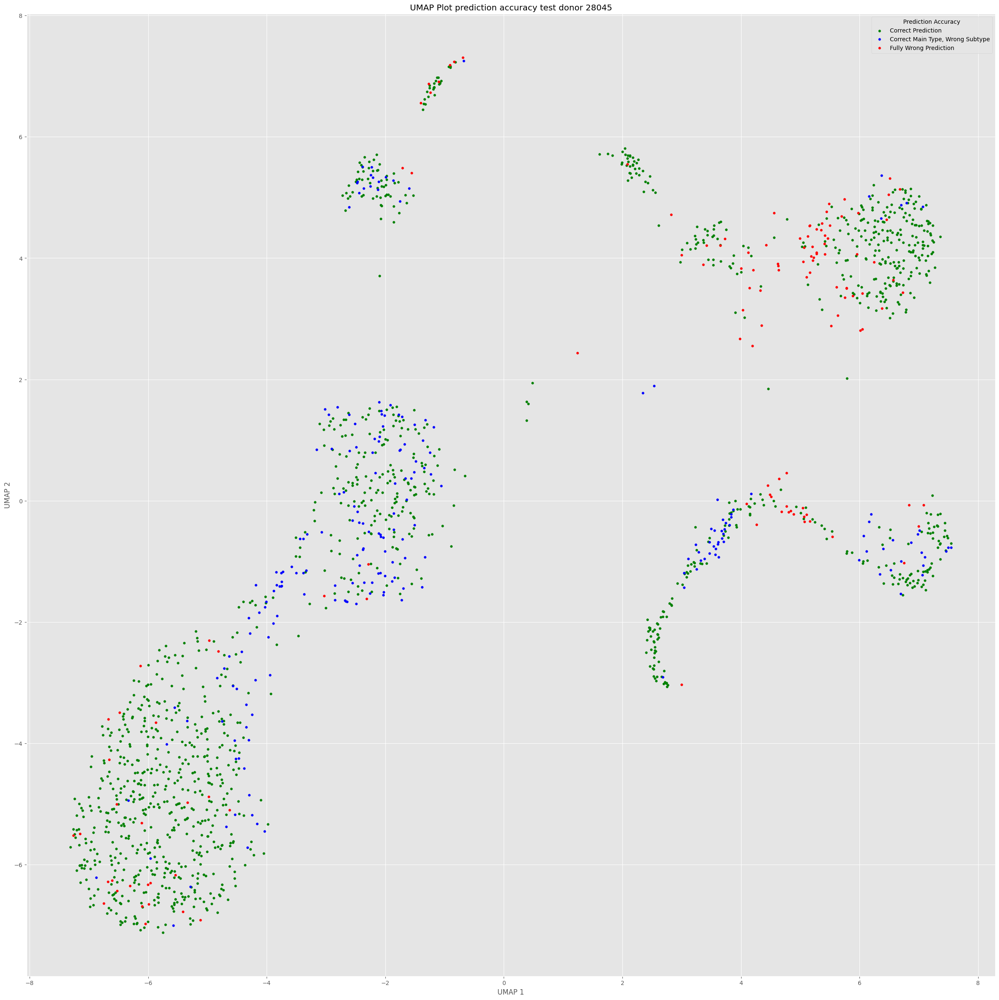

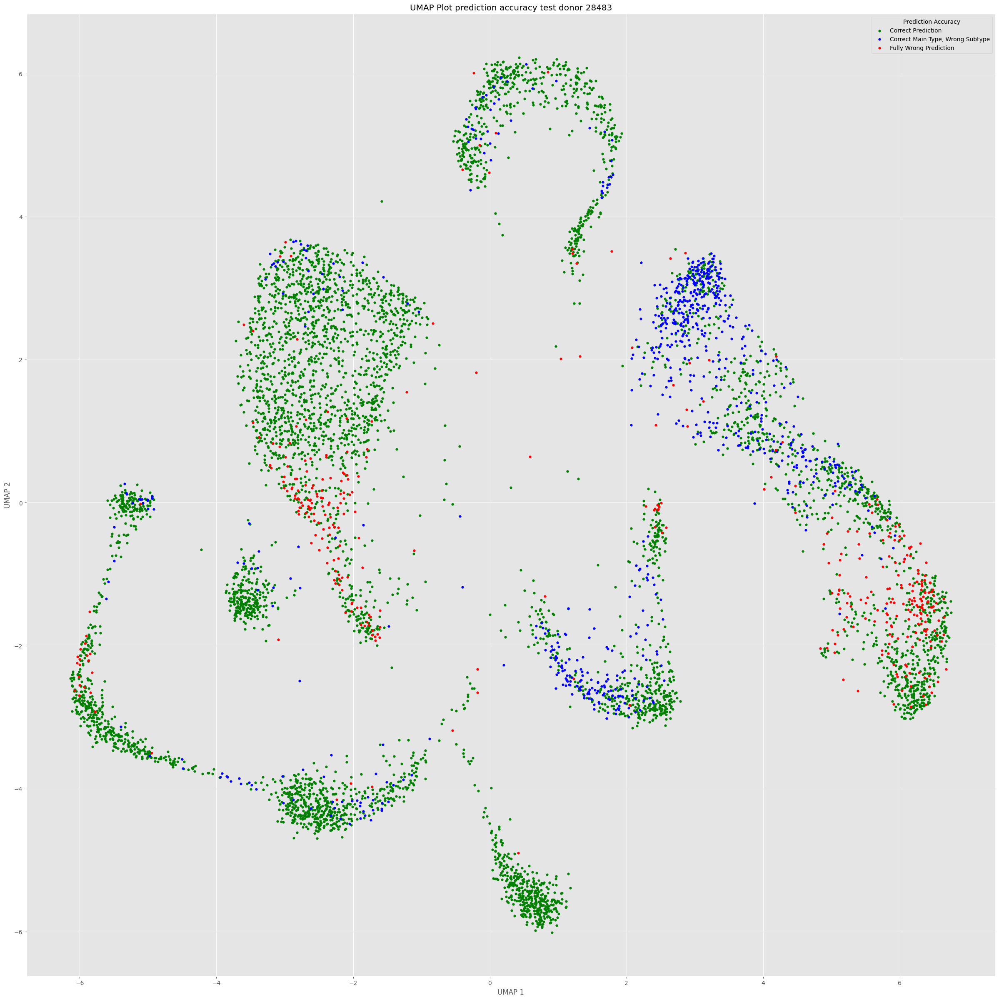

In [41]:
for d in donors:
    _dfilter = BMMC.obs['DonorID'] == d
    _umapcoords = BMMC.obsm['ATAC_umap'][_dfilter]
    _preds = full_pred[_dfilter]
    _labels = label_encoder.transform(BMMC.obs['cell_type'][_dfilter])
    show_predictions_umap(_umapcoords, _preds, _labels, label_encoder, _maincelltypes=True, title=f'UMAP Plot prediction accuracy {"test" if d in test_donors_idx else "train"} donor {d}', s=15)